In [117]:
import nltk
import spacy
import re
import unidecode
from nltk.corpus import stopwords
from numpy import *
import pandas as pd 
import requests 
import re
import pdfplumber
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.cluster import KMeans
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from collections import defaultdict
import pyLDAvis.gensim_models
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
pyLDAvis.enable_notebook()
import pyLDAvis.lda_model
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt


ModuleNotFoundError: No module named 'pyLDAvis.sklearn'

In [ ]:
nltk.download('stopwords')
greek_stopwords = set(stopwords.words('greek'))
nlp = spacy.load('el_core_news_sm')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\steve\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
def preprocess_text(text):
    #process our text and return it as embeddings
    text = re.sub(r"[^α-ωΑ-Ωάέήίόύώϊϋΐΰ\s]", "", text)

    text = text.lower()
    
    sentences = text.split('\n')
    
    tokenized_sentences = []

    for sentence in sentences:
        doc = nlp(sentence)
        
        tokens = [str(token.lemma_) for token in doc if token.text not in greek_stopwords and not token.is_punct]
        
        tokens = [token for token in tokens if len(token) > 2]

        if tokens:
            tokenized_sentences.append(tokens)
    return tokenized_sentences


Let us create a list of books , upon which we will train our model.

In [4]:
books = ['https://1oholargou.wordpress.com/wp-content/uploads/2012/08/13078091-31328.pdf',
        'https://derkamerad.com/wp-content/uploads/2016/09/cebcceb1cf84cf89cebcceb5cebdceb1-cf87cf89cebcceb1cf84ceb1-ceb4ceb9ceb4cf89-cf83cf89cf84ceb7cf81ceb9cebfcf85.pdf',
          'https://schoolpress.sch.gr/periodista/files/2022/02/%CE%A4%CE%BF-%CE%9C%CE%BF%CE%BD%CF%8C%CE%B3%CF%81%CE%B1%CE%BC%CE%BC%CE%B11.pdf',
          'http://7gym-athin.att.sch.gr/wordpress/wp-content/uploads/2020/03/Aiolike-Ge-Elias-Benezes.pdf',
          'https://books.shopflix.gr/9786180103106.pdf',
          'https://www.patakis.gr/files/1187291.pdf',
          'https://manifestolibrary.noblogs.org/files/2020/10/441339144-%CE%86%CF%81%CE%B7%CF%82-%CE%91%CE%BB%CE%B5%CE%BE%CE%AC%CE%BD%CE%B4%CF%81%CE%BF%CF%85-%CF%84%CE%BF-%CE%BA%CE%B9%CE%B2%CF%8E%CF%84%CE%B9%CE%BF-pdf.pdf', #sometimes this one crushes
         #'https://www.xn--ixauk7au.gr/%CE%B4%CF%89%CF%81%CE%B5%CE%AC%CE%BD-ebooks/Alexandros_Papadiamandis-I_Fonissa.pdf' #doesnt work
         'https://esperos-library.ucoz.com/_ld/1/177_psathas.pdf',
         'https://archeia.moec.gov.cy/sm/371/diig_vizyinou_odig_ekpaid.pdf' #this works
         #'https://blogs.sch.gr/idaragiannis/files/2017/02/ena-paidi-metraei-t-astra.pdf' #doesnt work
 ]

In [5]:
def download_book(book, i):
    
    #download the book and save it as a pdf file
    response = requests.get(book)
    pdf_path = f"{i}.pdf"
    with open(pdf_path, "wb") as f:
        f.write(response.content)
        
    #save the pdf as a string
    with pdfplumber.open(pdf_path) as pdf:
        text = ""
        for page in pdf.pages:
            text += page.extract_text() + "\n"  
    return text

Download our books, save them as pdfs, convert them to strings, tokenize them, and add them to our corpus.

In [6]:
all_tokens = []
corpus = []
for i,book in enumerate(books):
    book_text = download_book(book, i)
    tokens = preprocess_text(book_text)
    book_text_processed = " ".join(word for sentence in tokens for word in sentence)
    corpus.append(book_text_processed)
    all_tokens.extend(tokens)

In [79]:
print(all_tokens)

[['ηλιο', 'βενεζη'], ['ακαδημία', 'αθηνών'], ['νούμερο'], ['βιβλιο', 'σκλαβια'], ['εισαγωγή', 'δημήτρης', 'δασκαλόπουλος'], ['τεσσαρακοστος', 'εβδομος', 'εκδοση'], ['βιβλιοπωλειον', 'εστια'], ['κολλαρο', 'σιος'], ['αθηνα'], ['νούμερο', 'είμαι', 'ίδιος', 'ταυτότητα', 'συγγραφέα', 'παιδί'], ['δεκαοκτώς', 'χρόνος', 'οδηγώ', 'από', 'τούρκους', 'σε ο', 'κάτεργα', 'ανατολή'], ['βιβλίο', 'είμαι', 'ένας', 'συγκλονιστικός', 'χρονικός', 'γραμμένος', 'αίμα', 'όπως', 'επισημαίνω'], ['βενέζης', 'προσθέτοντα', 'λέω', 'καυτής', 'ύλη', 'σάρκα', 'στάζω'], ['αίμα', 'μου', 'πλημμυρίζω', 'σελίδα', 'αρχικός', 'μορφή', 'γράφτηκε'], ['ξαναδουλεύτηκε', 'οπότε', 'εκδόθηκε', 'πρώτος', 'φορά', 'επιτυχία'], ['σημείωσε', 'είμαι', 'τεράστιος', 'ακόμα', 'έξω', 'από', 'ελληνικός', 'χώρος'], ['ηλία', 'βενέζης', 'βιβλίομαρτυρία', 'είμαι', 'γραώνμ', 'πρώτος', 'πρόσωπος'], ['πραγματικός', 'όνομα', 'αφηγητήσυγγραφέα', 'γεννήθηκε', 'αϊβαλί', 'ρθε'], ['Ελλάδα', 'μικρασιατικός', 'καταστροφή', 'θεωρώ', 'ένας', 'από'], ['κυριό

In [8]:
print(corpus)

['ηλιο βενεζη ακαδημία αθηνών νούμερο βιβλιο σκλαβια εισαγωγή δημήτρης δασκαλόπουλος τεσσαρακοστος εβδομος εκδοση βιβλιοπωλειον εστια κολλαρο σιος αθηνα νούμερο είμαι ίδιος ταυτότητα συγγραφέα παιδί δεκαοκτώς χρόνος οδηγώ από τούρκους σε ο κάτεργα ανατολή βιβλίο είμαι ένας συγκλονιστικός χρονικός γραμμένος αίμα όπως επισημαίνω βενέζης προσθέτοντα λέω καυτής ύλη σάρκα στάζω αίμα μου πλημμυρίζω σελίδα αρχικός μορφή γράφτηκε ξαναδουλεύτηκε οπότε εκδόθηκε πρώτος φορά επιτυχία σημείωσε είμαι τεράστιος ακόμα έξω από ελληνικός χώρος ηλία βενέζης βιβλίομαρτυρία είμαι γραώνμ πρώτος πρόσωπος πραγματικός όνομα αφηγητήσυγγραφέα γεννήθηκε αϊβαλί ρθε Ελλάδα μικρασιατικός καταστροφή θεωρώ ένας από κυριότερους εκπροσώπους γενιά νεοελληνικός πεζογραφία τεσσαρακοστή τρίτος έκδοση βιβλίου ηλία βενέζη νούμερο αναστοιχειοθετήθηκε προτάχθηκε αυτός εισαγωγικός κείμενο δημήτρη δασκαλόπουλου νέος έκδοση κυκλοφόρησε φεβρουάριο σειρά νεοελληνικός λογοτεχνία      τεσσαρακοστός έβδομος έκδοση σεπτέμβριος βιβλιοπωλ

Let us train a tf idf vectorizer on these sentences!

In [9]:
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(corpus)

feature_names = vectorizer.get_feature_names_out()
tfidf_scores = np.array(tfidf_matrix.mean(axis=0)).flatten()

word_tfidf = dict(zip(feature_names, tfidf_scores))

Check the words with the highest tf idf score, aka common words that are non distinctive!

In [81]:
print("top 100 words by tf-idf score:")
sorted_tfidf = sorted(word_tfidf.items(), key=lambda x: x[1], reverse=True)
for word, score in sorted_tfidf[:100]:
    print(word, score)

top 100 words by tf-idf score:
μου 0.33014664606819943
ένας 0.2530371594097735
είμαι 0.20779332480623672
από 0.17882956683666243
εγώ 0.16465068443143457
έχω 0.1474751591969245
αυτός 0.1292789469467745
σε 0.12496732239695829
άλλος 0.08428008524747986
όλος 0.06752035464073736
ότι 0.06104674599189961
λέγω 0.050800701612828535
στός 0.050010273955539634
πού 0.044953947197309496
γιατί 0.04481225488100391
πολύ 0.04365656252343504
μεγάλος 0.04237617895128592
γιά 0.037859848875035566
σαν 0.03730300193102884
μέσα 0.035844103864142676
σου 0.03566138082470396
μπορώ 0.035509227569849304
κάνω 0.03512706315647767
αλλά 0.03451984485933954
πιο 0.03416303626139752
εκεί 0.033695583088690986
γίνομαι 0.033508399964033785
δυο 0.03350521543352992
τώρα 0.033403930492964425
οποίος 0.03337909554757737
ώρα 0.03326407292105438
όταν 0.03310431508532795
εκείνος 0.03301402822233744
λέει 0.03234874827343096
όμως 0.03223492598267508
πρώτος 0.031902623120361503
ακός 0.03143533976883117
χέρι 0.031349554303658156
ακόμα 0

Define a function that filters words, based on their tf idf score, since we do not care about words that are all over our documents, because they are not distinctive in terms of our target word!

In [11]:
tfidf_threshold = np.percentile(list(word_tfidf.values()), 90)  # top 10% most common words

def filter_words_by_tfidf(similar_words, word_tfidf, threshold):
    return [(word, score) for word, score in similar_words if word_tfidf.get(word, 0) > threshold]

In [12]:
model = Word2Vec(all_tokens, vector_size=200, window=5, min_count=3, workers=8)

model.save("greek_word2vec.model")

In [13]:
word_index = model.wv.key_to_index.get('μαύρος', 'Word not found in vocabulary')

print(f"Index of '': {word_index}")

Index of '': 2412


In [14]:
vocab = model.wv.index_to_key
print(vocab[146]) 

δια


In [127]:

similar_words_woman = model.wv.most_similar('γυναίκα', topn=200)
similar_words_man = model.wv.most_similar('άντρας', topn=200)

Similar words to man, without tf idf

In [128]:
print("\nSimilar words to 'γυναίκα':")
for word in similar_words_woman:
    print(word)


Similar words to 'γυναίκα':
('όπλο', 0.9997583627700806)
('καρδιά', 0.9997487664222717)
('πάω', 0.9997369050979614)
('δείχνω', 0.9997366070747375)
('καθώς', 0.9997302293777466)
('απάνω', 0.9997272491455078)
('προσπαθώ', 0.999725341796875)
('τότης', 0.9997209310531616)
('ψυχή', 0.9997151494026184)
('ιστορία', 0.9997134208679199)
('παππός', 0.9997119903564453)
('θέση', 0.9997116923332214)
('παιδάκι', 0.9997102618217468)
('πρόσωπό', 0.9997081160545349)
('σύντροφος', 0.9997056126594543)
('φέρω', 0.9997032880783081)
('χαρά', 0.999701201915741)
('μάνα', 0.9997003078460693)
('φωνάζω', 0.9996979236602783)
('όνομα', 0.9996978044509888)
('πάει', 0.9996973276138306)
('εαυτός', 0.9996968507766724)
('μάλλον', 0.9996938705444336)
('άνθρωπος', 0.9996932744979858)
('άδειος', 0.9996917247772217)
('κορίτσι', 0.9996903538703918)
('πορεία', 0.9996891021728516)
('φίλος', 0.9996866583824158)
('καθένας', 0.9996851682662964)
('μέσο', 0.9996842741966248)
('αρχηγός', 0.9996839761734009)
('ακριβώς', 0.999683141

Similar words to man, without tf idf

In [129]:
print("\nSimilar words to 'άντρας':")
for word in similar_words_man:
    print(word)


Similar words to 'άντρας':
('στρατιώτης', 0.9997652769088745)
('μάχη', 0.9997506141662598)
('έξω', 0.9997500777244568)
('μος', 0.9997447729110718)
('κάρο', 0.9997410774230957)
('νεκρός', 0.9997395873069763)
('δύο', 0.9997368454933167)
('δίπλας', 0.9997298121452332)
('είδε', 0.9997272491455078)
('πέντε', 0.9997215270996094)
('άκρη', 0.9997138381004333)
('είκοσι', 0.9997124671936035)
('πήρε', 0.9997115135192871)
('πρόσωπο', 0.9997105598449707)
('είδα', 0.9997060298919678)
('ρίχνω', 0.9997044801712036)
('σπίτι', 0.9997029900550842)
('σφαίρα', 0.9997022151947021)
('έβγαλε', 0.9997021555900574)
('ίσαμε', 0.9996970295906067)
('νερό', 0.9996966123580933)
('οπότε', 0.9996958374977112)
('πλήθος', 0.9996933341026306)
('φωτιά', 0.9996921420097351)
('πόλη', 0.9996894001960754)
('άλογα', 0.9996886849403381)
('ενώ', 0.999686598777771)
('επάνω', 0.9996864199638367)
('σειρά', 0.9996855854988098)
('στερα', 0.9996850490570068)
('φως', 0.9996840357780457)
('φτάνω', 0.9996825456619263)
('πέφτω', 0.999682

Use tf idf for both groups, in order to filter non distinctive words (aka words that appear all over the book, and not just our target tokens)

In [132]:

similar_words_man_filtered = filter_words_by_tfidf(similar_words_man, word_tfidf, tfidf_threshold)
similar_words_woman_filtered = filter_words_by_tfidf(similar_words_woman, word_tfidf, tfidf_threshold)


In [131]:
def find_similar(word):
    similar_words = model.wv.most_similar(word, topn=1000)
    similar_words_filtered = filter_words_by_tfidf(similar_words, word_tfidf, tfidf_threshold)
    return similar_words, similar_words_filtered

In [133]:
print("\nFiltered similar words to 'γυναίκα':")
for word, score in similar_words_woman_filtered:
    print(word, score)


Filtered similar words to 'γυναίκα':
όπλο 0.9997583627700806
καρδιά 0.9997487664222717
πάω 0.9997369050979614
δείχνω 0.9997366070747375
καθώς 0.9997302293777466
απάνω 0.9997272491455078
προσπαθώ 0.999725341796875
τότης 0.9997209310531616
ψυχή 0.9997151494026184
ιστορία 0.9997134208679199
παππός 0.9997119903564453
θέση 0.9997116923332214
παιδάκι 0.9997102618217468
πρόσωπό 0.9997081160545349
σύντροφος 0.9997056126594543
φέρω 0.9997032880783081
χαρά 0.999701201915741
μάνα 0.9997003078460693
φωνάζω 0.9996979236602783
όνομα 0.9996978044509888
πάει 0.9996973276138306
εαυτός 0.9996968507766724
μάλλον 0.9996938705444336
άνθρωπος 0.9996932744979858
άδειος 0.9996917247772217
κορίτσι 0.9996903538703918
πορεία 0.9996891021728516
φίλος 0.9996866583824158
καθένας 0.9996851682662964
μέσο 0.9996842741966248
αρχηγός 0.9996839761734009
ακριβώς 0.999683141708374
αφήνω 0.9996805787086487
γυναικόπαιδα 0.9996804594993591
αντάρτης 0.9996801018714905
αλέκος 0.9996784329414368
παλληκάριο 0.9996777772903442
τύ

In [135]:
print("\nFiltered similar words to 'άνδρας':")
for word, score in similar_words_man_filtered:
    print(word, score)


Filtered similar words to 'άνδρας':
στρατιώτης 0.9997652769088745
μάχη 0.9997506141662598
έξω 0.9997500777244568
μος 0.9997447729110718
κάρο 0.9997410774230957
νεκρός 0.9997395873069763
δύο 0.9997368454933167
δίπλας 0.9997298121452332
είδε 0.9997272491455078
πέντε 0.9997215270996094
άκρη 0.9997138381004333
είκοσι 0.9997124671936035
πήρε 0.9997115135192871
πρόσωπο 0.9997105598449707
είδα 0.9997060298919678
ρίχνω 0.9997044801712036
σπίτι 0.9997029900550842
σφαίρα 0.9997022151947021
έβγαλε 0.9997021555900574
ίσαμε 0.9996970295906067
νερό 0.9996966123580933
οπότε 0.9996958374977112
πλήθος 0.9996933341026306
φωτιά 0.9996921420097351
πόλη 0.9996894001960754
άλογα 0.9996886849403381
ενώ 0.999686598777771
επάνω 0.9996864199638367
σειρά 0.9996855854988098
στερα 0.9996850490570068
φως 0.9996840357780457
φτάνω 0.9996825456619263
πέφτω 0.9996824264526367
ώσπου 0.9996814131736755
πληθυσμός 0.9996761679649353
απόσταση 0.999675989151001
χώρος 0.9996726512908936
κύμα 0.999672532081604
παλιός 0.999672

In [87]:
similar_words_black = model.wv.most_similar('μαύρος', topn=500)
similar_words_black_filtered = filter_words_by_tfidf(similar_words_black, word_tfidf, tfidf_threshold)
for w in similar_words_black_filtered:
    print(w)

('περιοχή', 0.9991844892501831)
('λαός', 0.9991787075996399)
('ναός', 0.9991716742515564)
('ξένος', 0.9991681575775146)
('στρατός', 0.9991535544395447)
('βροχή', 0.999153196811676)
('τουρκικός', 0.9991512894630432)
('τούρκικος', 0.9991498589515686)
('μέχρι', 0.999146580696106)
('τούρκος', 0.9991463422775269)
('λληνος', 0.9991452693939209)
('τσέτης', 0.9991446733474731)
('ελλήνος', 0.9991443753242493)
('πρόσωπος', 0.9991430640220642)
('πληθυσμός', 0.999136745929718)
('μέσο', 0.9991366863250732)
('καθώς', 0.9991366267204285)
('πήγε', 0.9991365671157837)
('δράση', 0.9991339445114136)
('σκοτεινός', 0.9991315603256226)
('πλήθος', 0.9991303086280823)
('επιτροπή', 0.9991293549537659)
('προσπαθώ', 0.999129056930542)
('ανταρτών', 0.9991288185119629)
('μερικοί', 0.9991266131401062)
('υποστατικός', 0.9991245865821838)
('μέλος', 0.9991238713264465)
('κόσμου', 0.9991236925125122)
('ελληνικός', 0.9991220235824585)
('οπλαρχηγός', 0.9991220235824585)
('τμήμα', 0.9991218447685242)
('σάντα', 0.999121725

In [88]:
print(corpus[4])

αηδονοπιτα ιδι φραουστ νέος σύνορο λιβάνη νέος έκδοση αναθεωρημένη εκδόσεις πατάκη αποσπασμα βιβλιο ωκεανου εκδόσεις πατάκη νέος έκδοση εκδόσεις πατάκη ψιχος εκεινου καλοκαιριος εκδόσεις πατάκη σκι πεταλουδα εκδόσεις πατάκη αηδονοπιτα εκδόσεις πατάκη ανεμωλιο εκδόσεις πατάκη σκηνος βιο ματιας αλμοσινο εκδόσεις πατάκη λιγες ένας νυχτος εκδόσεις πατάκη ισιδωρος ζουργος αηδονοπιτα μυθιστόρημα θέση υπογραφή δικαιούχου δικαίωμα πνευματικός ιδιοκτησία εφόσον αυτός προβλέπω από σύμβαση παρόν έργο πνευματικός ιδιοκτησία προστατεύω διάταξη ελληνικός μοθεσία όπως έχω τροποποιώ ισχύω σήμερα διεθνής σύμβαση πνευματικός ιδιοκτησία απαγορεύω απόλυτα άνευ γραπτός αδεία εκδότη οποιονδήποτε τρόπος μέσος ηλεκτρονικός μηχανικός άλλος αντιγραφή φωτοανατύπωση γένω αναπαραγωγή εκμίσθωση δανεισμός μετάφραση διασκευή αναμετάδοση κοινός οποιοσδήποτε μορφή γένω εκμετάλλευση συνόλου μέρος έργο κδόσεις πατάκη σύγχρονη ελληνικός λογοτεχνία πεζογραφία ισίδωρος ζουργός αηδονόπιτα πεύθυνος έκδοση ώστα γιαννόπουλος επ

In [89]:
for w in all_tokens:
    print(w)

['ηλιο', 'βενεζη']
['ακαδημία', 'αθηνών']
['νούμερο']
['βιβλιο', 'σκλαβια']
['εισαγωγή', 'δημήτρης', 'δασκαλόπουλος']
['τεσσαρακοστος', 'εβδομος', 'εκδοση']
['βιβλιοπωλειον', 'εστια']
['κολλαρο', 'σιος']
['αθηνα']
['νούμερο', 'είμαι', 'ίδιος', 'ταυτότητα', 'συγγραφέα', 'παιδί']
['δεκαοκτώς', 'χρόνος', 'οδηγώ', 'από', 'τούρκους', 'σε ο', 'κάτεργα', 'ανατολή']
['βιβλίο', 'είμαι', 'ένας', 'συγκλονιστικός', 'χρονικός', 'γραμμένος', 'αίμα', 'όπως', 'επισημαίνω']
['βενέζης', 'προσθέτοντα', 'λέω', 'καυτής', 'ύλη', 'σάρκα', 'στάζω']
['αίμα', 'μου', 'πλημμυρίζω', 'σελίδα', 'αρχικός', 'μορφή', 'γράφτηκε']
['ξαναδουλεύτηκε', 'οπότε', 'εκδόθηκε', 'πρώτος', 'φορά', 'επιτυχία']
['σημείωσε', 'είμαι', 'τεράστιος', 'ακόμα', 'έξω', 'από', 'ελληνικός', 'χώρος']
['ηλία', 'βενέζης', 'βιβλίομαρτυρία', 'είμαι', 'γραώνμ', 'πρώτος', 'πρόσωπος']
['πραγματικός', 'όνομα', 'αφηγητήσυγγραφέα', 'γεννήθηκε', 'αϊβαλί', 'ρθε']
['Ελλάδα', 'μικρασιατικός', 'καταστροφή', 'θεωρώ', 'ένας', 'από']
['κυριότερους', 'εκπροσώπου

Let us check the differences between men and women better

In [136]:
woman = set(similar_words_woman_filtered) - set(similar_words_man_filtered)
for c in woman:
    print(c)

('αφηγητής', 0.9996281862258911)
('πρόσωπό', 0.9997081160545349)
('χώρα', 0.9996302723884583)
('βρίσκω', 0.9996657967567444)
('περίμενε', 0.9996286630630493)
('περιγραφή', 0.9996365904808044)
('πήγαινε', 0.9996345043182373)
('κορμί', 0.9996135830879211)
('σωστός', 0.9996121525764465)
('αποφασίζω', 0.9996095299720764)
('άρα', 0.9996070265769958)
('παππού', 0.9996716380119324)
('χριστόφορος', 0.9995965361595154)
('κίνηση', 0.9996092319488525)
('συνεχώς', 0.9996083378791809)
('παλικάριο', 0.9996111392974854)
('τραπεζούντα', 0.9996305704116821)
('μάνα', 0.9997003078460693)
('παιδάκι', 0.9997102618217468)
('λέξη', 0.9996194243431091)
('φωλιά', 0.9996083974838257)
('παππός', 0.9997119903564453)
('τελείως', 0.9995931386947632)
('κόκκινος', 0.9996281862258911)
('άλλοτε', 0.9996144771575928)
('κοίταξε', 0.9996463060379028)
('δείχνω', 0.9997366070747375)
('μερικοί', 0.9996468424797058)
('εποχή', 0.9996554851531982)
('στρατιωτικός', 0.999630868434906)
('έμενε', 0.9995913505554199)
('δίχως', 0.999

In [144]:
man = set(similar_words_man_filtered) - set(similar_words_woman_filtered)
for c in man:
    print(c)

('κεντρικός', 0.9995779991149902)
('αυλή', 0.9995879530906677)
('θάνατος', 0.9995710849761963)
('χώρος', 0.9996726512908936)
('ελληνικός', 0.9995965957641602)
('πήγα', 0.9996686577796936)
('τέσσερις', 0.9996271729469299)
('οδηγώ', 0.9996324181556702)
('αγωνία', 0.9996705055236816)
('υποστατικός', 0.9995958209037781)
('ξένος', 0.999610424041748)
('επάνω', 0.9996864199638367)
('κρυφά', 0.9996091723442078)
('οπότε', 0.9996958374977112)
('ολόκληρος', 0.9996604323387146)
('πρωί', 0.9995681047439575)
('απέναντι', 0.9996335506439209)
('μάχη', 0.9997506141662598)
('ανταρτών', 0.9996598958969116)
('κίνηση', 0.9996331930160522)
('κάπου', 0.9996064901351929)
('γης', 0.9995881915092468)
('σπίτι', 0.9997029900550842)
('πήραν', 0.9995802640914917)
('μόλις', 0.9995705485343933)
('πρόσωπο', 0.9997105598449707)
('βρίσκω', 0.9996145367622375)
('μέλος', 0.9995636940002441)
('τόσος', 0.9996511936187744)
('τσέτης', 0.9996213912963867)
('ματιά', 0.9996258020401001)
('άκουσα', 0.9995704889297485)
('περιοχή',

Count occurances

In [ ]:
words_to_count = ['γυναίκα', 'άντρας']

word_counts = {word: sum([sentence.count(word) for sentence in all_tokens]) for word in words_to_count}

# Print the results
for word, count in word_counts.items():
    print(f"The word '{word}' appears {count} times in the corpus.")


The word 'γυναίκα' appears 302 times in the corpus.
The word 'άντρας' appears 222 times in the corpus.


In [145]:
words_to_count = ['κορίτσι', 'αγόρι']

word_counts = {word: sum([sentence.count(word) for sentence in all_tokens]) for word in words_to_count}

for word, count in word_counts.items():
    print(f"The word '{word}' appears {count} times in the corpus.")


The word 'κορίτσι' appears 109 times in the corpus.
The word 'αγόρι' appears 38 times in the corpus.


In [33]:
girl, girl_filtered = find_similar('κορίτσι')
for c in girl_filtered:
    print(c)

('αντάρτης', 0.9998214840888977)
('ωστόσο', 0.9998181462287903)
('όνομα', 0.9998141527175903)
('δείχνω', 0.9998123645782471)
('ταξίδι', 0.999811589717865)
('ακριβώς', 0.9998077154159546)
('χαρά', 0.9998076558113098)
('πάντα', 0.9998059272766113)
('σκοπός', 0.9998039603233337)
('καθώς', 0.999803900718689)
('καθένας', 0.9998036026954651)
('τσι', 0.999801754951477)
('τότης', 0.9998001456260681)
('βρίσκω', 0.9997990131378174)
('μάλλον', 0.9997977614402771)
('αρχή', 0.9997977614402771)
('πορεία', 0.9997936487197876)
('δύναμη', 0.9997923970222473)
('μάλιστα', 0.999792218208313)
('σύντροφος', 0.9997918009757996)
('τόπος', 0.9997897744178772)
('τελικά', 0.9997859597206116)
('τούρκοι', 0.999785840511322)
('προσπάθεια', 0.9997847676277161)
('ιστορία', 0.9997839331626892)
('σχεδόν', 0.9997828006744385)
('περιμένω', 0.9997813701629639)
('προσπαθώ', 0.9997802972793579)
('ήσαν', 0.9997800588607788)
('λέξη', 0.9997797012329102)
('όπλο', 0.9997767210006714)
('είχανε', 0.9997764229774475)
('κόσμος', 0.

Can the model consider women as queens ?

In [95]:
result = model.wv.most_similar(positive=['γυναίκα', 'βασιλιάς'], negative=['άνδρας'], topn=5)
print("Analogy result:", result)


Analogy result: [('τροφή', 0.9918212294578552), ('τσαός', 0.9916496276855469), ('θεία', 0.9915812015533447), ('μείνανε', 0.9915726184844971), ('τραγωδία', 0.9915371537208557)]


In [35]:
len(all_tokens)

38593

In [96]:
similarity = model.wv.similarity('άνδρας', 'γυναίκα')
print(f"man woman similarity: {similarity}")

print(model.wv.similarity('πατέρας', 'μητέρα'))
print(model.wv.similarity('αγόρι', 'κορίτσι'))

man woman similarity: 0.996728777885437
0.99901354
0.99965286


Is one gender more likely to have an established career ?

In [97]:
professions = ['γιατρός', 'μηχανικός', 'δικηγόρος',  'καθηγητής']

for profession in professions:
    sim_man = model.wv.similarity('άνδρας', profession)
    sim_woman = model.wv.similarity('γυναίκα', profession)
    print(f"{profession}: άνδρας ({sim_man:.2f}) vs. γυναίκα ({sim_woman:.2f})")


γιατρός: άνδρας (1.00) vs. γυναίκα (1.00)
μηχανικός: άνδρας (0.99) vs. γυναίκα (1.00)
δικηγόρος: άνδρας (1.00) vs. γυναίκα (1.00)
καθηγητής: άνδρας (1.00) vs. γυναίκα (1.00)


In [153]:
greek_sim = model.wv.most_similar('ρωμιός', topn=40)
turk_sim = model.wv.most_similar('τούρκος', topn=40)
greek_filtered = filter_words_by_tfidf(greek_sim, word_tfidf, tfidf_threshold)

print("Words similar to 'Έλληνας':")
for greek in greek_filtered:
    print(greek)


Words similar to 'Έλληνας':
('βρίσκω', 0.9997448325157166)
('αντάρτης', 0.9997365474700928)
('κόσμος', 0.9997364282608032)
('πορεία', 0.9997339248657227)
('τόπος', 0.9997328519821167)
('αρχή', 0.9997247457504272)
('δύναμη', 0.9997221827507019)
('θάνατος', 0.9997203946113586)
('προσπαθώ', 0.9997189044952393)
('ακούω', 0.9997179508209229)
('μερικοί', 0.9997166991233826)
('ακριβώς', 0.9997122287750244)
('σάντα', 0.9997111558914185)
('πάει', 0.9997110962867737)
('στρατός', 0.9997105598449707)
('τσέτης', 0.9997103214263916)
('υπόγειο', 0.9997079968452454)
('μέσος', 0.9997058510780334)
('γυναικόπαιδα', 0.9997044801712036)
('μάλλον', 0.9997028708457947)
('καθώς', 0.9997021555900574)
('πρόσωπος', 0.9997020363807678)
('γράφω', 0.9997014403343201)
('είχανε', 0.9996996521949768)
('σχεδόν', 0.9996994137763977)
('γράμματα', 0.999698281288147)
('αξιωματικός', 0.9996976256370544)
('πληθυσμός', 0.9996972680091858)
('κιβώτιος', 0.9996963143348694)
('ξένος', 0.9996956586837769)
('λληνη', 0.9996916651725

In [154]:
    
turk_sim_filtered = filter_words_by_tfidf(turk_sim, word_tfidf, tfidf_threshold)
print("Words similar to 'Τούρκος':")
for turk in turk_sim_filtered:
    print(turk)

Words similar to 'Τούρκος':
('καθώς', 0.9998765587806702)
('οπλαρχηγός', 0.9998728036880493)
('έργο', 0.9998722672462463)
('προσπαθώ', 0.9998669028282166)
('πόντος', 0.9998576045036316)
('σχεδόν', 0.9998564124107361)
('ελλήνος', 0.999856173992157)
('πασάς', 0.9998552203178406)
('σταμάτης', 0.999852180480957)
('τελικά', 0.9998506307601929)
('πορεία', 0.9998499751091003)
('τούτος', 0.9998487234115601)
('αγά', 0.9998474717140198)
('στρατιωτικός', 0.999847412109375)
('αγώνας', 0.9998446702957153)
('τουρκικός', 0.9998432993888855)
('αξιωματικός', 0.9998431205749512)
('λαός', 0.9998423457145691)
('αρχή', 0.9998421669006348)
('θάνατος', 0.9998418688774109)
('ψυχή', 0.9998412728309631)
('χριστιανός', 0.9998407363891602)
('μερικοί', 0.9998407363891602)
('γράφω', 0.999837338924408)
('αφήγηση', 0.9998365044593811)
('βρω', 0.9998364448547363)
('κεμάλ', 0.9998352527618408)
('φέρω', 0.999835193157196)
('διήγημα', 0.999833881855011)
('μάλλον', 0.9998335242271423)
('ελληνισμός', 0.9998326301574707)
('

In [42]:
similar_black = model.wv.most_similar('μαύρος', topn=20)
similar_foreigner = model.wv.most_similar('ξένος', topn=20)

print("Words similar to 'μαύρος':", similar_black)
print("Words similar to 'ξένος':", similar_foreigner)

Words similar to 'μαύρος': [('περιοχή', 0.9991844892501831), ('λαός', 0.9991787075996399), ('ναός', 0.9991716742515564), ('ξένος', 0.9991681575775146), ('στρατός', 0.9991535544395447), ('βροχή', 0.999153196811676), ('τουρκικός', 0.9991512894630432), ('τούρκικος', 0.9991498589515686), ('μέχρι', 0.999146580696106), ('τούρκος', 0.9991463422775269), ('λληνος', 0.9991452693939209), ('τσέτης', 0.9991446733474731), ('ελλήνος', 0.9991443753242493), ('πρόσωπος', 0.9991430640220642), ('πληθυσμός', 0.999136745929718), ('μέσο', 0.9991366863250732), ('καθώς', 0.9991366267204285), ('πήγε', 0.9991365671157837), ('δράση', 0.9991339445114136), ('σκοτεινός', 0.9991315603256226)]
Words similar to 'ξένος': [('σταμάτης', 0.9998676776885986), ('οπλαρχηγός', 0.9998673796653748), ('μερικοί', 0.9998652338981628), ('θάνατος', 0.9998636841773987), ('σχεδόν', 0.9998599290847778), ('τραπεζούντα', 0.9998584985733032), ('μέχρι', 0.9998558163642883), ('βρω', 0.9998554587364197), ('διήγημα', 0.9998552799224854), ('νας

In [68]:
corpus = [doc for doc in corpus if doc.strip()]
corpus_joined = " ".join(corpus)


In [156]:
display(corpus)

['ηλιο βενεζη ακαδημία αθηνών νούμερο βιβλιο σκλαβια εισαγωγή δημήτρης δασκαλόπουλος τεσσαρακοστος εβδομος εκδοση βιβλιοπωλειον εστια κολλαρο σιος αθηνα νούμερο είμαι ίδιος ταυτότητα συγγραφέα παιδί δεκαοκτώς χρόνος οδηγώ από τούρκους σε ο κάτεργα ανατολή βιβλίο είμαι ένας συγκλονιστικός χρονικός γραμμένος αίμα όπως επισημαίνω βενέζης προσθέτοντα λέω καυτής ύλη σάρκα στάζω αίμα μου πλημμυρίζω σελίδα αρχικός μορφή γράφτηκε ξαναδουλεύτηκε οπότε εκδόθηκε πρώτος φορά επιτυχία σημείωσε είμαι τεράστιος ακόμα έξω από ελληνικός χώρος ηλία βενέζης βιβλίομαρτυρία είμαι γραώνμ πρώτος πρόσωπος πραγματικός όνομα αφηγητήσυγγραφέα γεννήθηκε αϊβαλί ρθε Ελλάδα μικρασιατικός καταστροφή θεωρώ ένας από κυριότερους εκπροσώπους γενιά νεοελληνικός πεζογραφία τεσσαρακοστή τρίτος έκδοση βιβλίου ηλία βενέζη νούμερο αναστοιχειοθετήθηκε προτάχθηκε αυτός εισαγωγικός κείμενο δημήτρη δασκαλόπουλου νέος έκδοση κυκλοφόρησε φεβρουάριο σειρά νεοελληνικός λογοτεχνία      τεσσαρακοστός έβδομος έκδοση σεπτέμβριος βιβλιοπωλ

In [119]:
# For a corpus of 6 books:
tf_vectorizer = CountVectorizer(
    lowercase=True,
    max_df=0.85,       # Allow words present in ≤95% of documents (≤5.7 books → 5 books)
    min_df=2,          # Require words to appear in ≥2 books
    token_pattern=r'\b[\u0370-\u03FF]{3,}\b',  # Match Greek words with ≥3 letters
    stop_words=list(greek_stopwords)  # Use your Greek stopwords list
)

tf = tf_vectorizer.fit_transform(corpus)
print(tf.shape) 


(8, 10535)


In [120]:
n_topics = 10
print("Fitting LDA models with tf features, "
      f"n_samples={tf.shape[0]} and n_features={tf.shape[1]}...")
lda = LatentDirichletAllocation(n_components=n_topics, 
                                learning_method='online',
                                random_state=0)
lda.fit(tf)


Fitting LDA models with tf features, n_samples=8 and n_features=10535...


LatentDirichletAllocation(learning_method='online', random_state=0)

In [121]:
print(lda.components_.shape)
lda.components_

(10, 10535)


array([[ 0.32469413,  7.5529001 ,  2.69791776, ...,  3.35783995,
         3.71283144, 80.24215606],
       [ 1.05773879,  1.53681174,  8.82443211, ...,  0.30103213,
        11.62999878,  1.06032917],
       [ 0.29663233,  0.30309483,  0.27550229, ...,  0.3119593 ,
         0.39620131,  0.6581547 ],
       ...,
       [ 1.83789114,  1.74974781,  0.35404774, ...,  1.06758201,
        30.8716562 , 25.79694316],
       [ 0.29924303,  0.28347914,  0.33130146, ...,  0.31403903,
         0.62678339,  0.58919109],
       [ 0.27125819,  0.29604824,  0.3881887 , ...,  0.27248268,
         0.50924368,  0.54283359]])

In [122]:
n_top_words = 30
print("Topics in the LDA model:")
tf_feature_names = tf_vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx}")
    sorted_topics_indcs = (-topic).argsort()[:n_top_words]
    feature_names = [ tf_feature_names[i] for i in sorted_topics_indcs ]
    feature_counts = topic[sorted_topics_indcs]
    print(" ".join([ f'{fn} {fc:.2f}' for fn, fc in zip(feature_names, feature_counts)]))
    print()

Topics in the LDA model:
Topic 0
εις 658.21 οποίος 281.20 χωριό 208.56 ήσαν 196.45 τούρκοι 190.99 τούρκος 171.90 στρατός 171.42 επί 165.52 δια 158.45 πόντος 146.20 τούτος 139.06 αντάρτης 131.54 τας 126.73 τραπεζούντα 124.53 υπό 120.84 τούρκους 112.54 μέχρι 111.64 μάχη 109.73 βουνό 103.28 όπλο 101.88 πληθυσμός 90.26 τούρκικος 89.02 αρχηγός 88.11 μεταξύ 81.85 άντρας 81.42 επάνω 80.44 ώστε 80.24 αφηγητής 79.91 ομάδα 78.19 γεγονός 77.19

Topic 1
στρατιώτης 103.02 στερα 100.22 μονάχα 83.63 κοιτάζω 73.23 μεςς 70.19 σιγά 62.53 τότης 60.03 τούτος 50.19 ολοένα 50.12 αξιωματικός 49.49 μος 47.43 ρωτά 45.44 σύντροφος 43.75 λέω 42.97 όξω 40.83 παιδάκι 38.93 πράμα 38.62 κεφάλι 38.54 πάνου 37.95 ηλία 37.60 ίσαμε 37.57 σκλάβος 36.92 μητέρα 36.41 αίμα 35.63 μωρέ 35.27 μουρμουρίζω 34.70 τόπος 33.37 δίπλας 33.07 στρατόπεδο 32.55 μούτρο 31.93

Topic 2
εις 2.19 οποίος 1.48 ήτανε 1.42 χωριό 1.26 δηλαδή 1.24 ήσαν 1.18 μονάχα 1.17 τούρκοι 1.14 τούτος 1.07 επί 1.06 δια 1.06 στρατός 1.03 πόντος 1.03 πρώην 1.01 

In [123]:
pyLDAvis.enable_notebook()
pyLDAvis.lda_model.prepare(lda, tf, tf_vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.072443  0.122149       1        1  38.030837
7     -0.125894 -0.102114       2        1  25.424749
4      0.121499 -0.024740       3        1  21.316027
1      0.098411 -0.009731       4        1  15.224427
5     -0.005868 -0.000707       5        1   0.000660
3      0.001101  0.008119       6        1   0.000660
6     -0.004356  0.008322       7        1   0.000660
8     -0.002715 -0.007431       8        1   0.000660
9     -0.002782  0.000593       9        1   0.000660
2     -0.006953  0.005539      10        1   0.000660, topic_info=              Term        Freq       Total Category  logprob  loglift
3075           εις  834.000000  834.000000  Default  30.0000  30.0000
529          ήτανε  442.000000  442.000000  Default  29.0000  29.0000
6437        οποίος  416.000000  416.000000  Default  28.0000  28.0000
521           ήσαν  240.000000  240.000000  Default  27.0000  27.0000
10353        χωριό  314.000000  314.000000  Default  26.0000  26.0000
...            ...         ...         ...      ...      ...      ...
1247   αξιωματικός    0.000179  113.897076  Topic10  -8.4044  -1.4347
9463         τόπος    0.000198  193.632558  Topic10  -8.3016  -1.8626
9298   τραπεζούντα    0.000188  154.481442  Topic10  -8.3572  -1.6923
2985          είδα    0.000188  156.789611  Topic10  -8.3545  -1.7045
9206       τούρκος    0.000197  240.374983  Topic10  -8.3103  -2.0876

[711 rows x 6 columns], token_table=       Topic      Freq    Term
term                          
24         1  0.030552  άδειος
24         2  0.916566  άδειος
24         3  0.030552  άδειος
30         1  0.336778   άθλιο
30         4  0.336778   άθλιο
...      ...       ...     ...
10496      4  0.351131   όρμος
10534      1  0.751814    ώστε
10534      2  0.227110    ώστε
10534      3  0.007831    ώστε
10534      4  0.007831    ώστε

[1221 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 8, 5, 2, 6, 4, 7, 9, 10, 3])

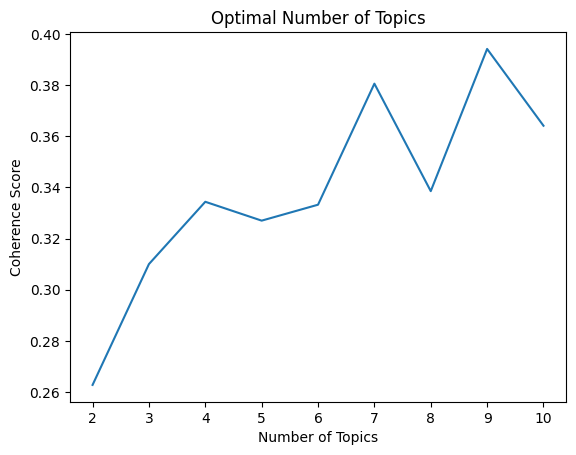

In [ ]:
topic_range = range(2, 11)  # Test 2-10 topics
coherence_scores = []
dictionary = Dictionary(all_tokens)

for num_topics in topic_range:
    # Train LDA
    lda = LatentDirichletAllocation(
        n_components=num_topics,
        learning_method='online',
        random_state=0
    )
    lda.fit(tf)  # Use your precomputed tf matrix
    
    # Calculate coherence score
    cm = CoherenceModel(
        topics=[[tf_feature_names[i] for i in topic.argsort()[:-30 - 1:-1]] for topic in lda.components_],
        texts=all_tokens,  # Your tokenized sentences (list of lists)
        dictionary=dictionary,  # From gensim.corpora.Dictionary
        coherence='c_v'
    )
    coherence_scores.append(cm.get_coherence())

plt.plot(topic_range, coherence_scores)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.title("Optimal Number of Topics")
plt.show()


In [140]:
optimal_topics = topic_range[np.argmax(coherence_scores)]
print(f"Optimal number of topics: {optimal_topics}")

lda = LatentDirichletAllocation(
    n_components=optimal_topics,
    learning_method='online',
    random_state=0
)
lda.fit(tf)

tf_feature_names = tf_vectorizer.get_feature_names_out()


target_word = "γυναίκα"

# Find topics where "γυναίκα" is among the top words
related_topics = []
for topic_idx, topic in enumerate(lda.components_):
    top_words_idx = topic.argsort()[:-30 - 1:-1]  # Top 30 words per topic
    top_words = [tf_feature_names[i] for i in top_words_idx]
    if target_word in top_words:
        related_topics.append(topic_idx)

# Expand to related words using Word2Vec (optional)
similar_words = [word for word, _ in model.wv.most_similar(target_word, topn=10)]
for word in similar_words:
    for topic_idx, topic in enumerate(lda.components_):
        top_words_idx = topic.argsort()[:-30 - 1:-1]
        top_words = [tf_feature_names[i] for i in top_words_idx]
        if word in top_words and topic_idx not in related_topics:
            related_topics.append(topic_idx)


Optimal number of topics: 9


In [ ]:
lda = LatentDirichletAllocation(n_components=optimal_topics, learning_method='online', random_state=0)
lda.fit(tf)

target_word = "γυναίκα"
related_topics = []
for topic_idx, topic in enumerate(lda.components_):
    top_words = [tf_feature_names[i] for i in topic.argsort()[:-30 - 1:-1]]  # Top 30 words
    if target_word in top_words:
        related_topics.append(topic_idx)

if 'model' in locals():
    similar_words = [word for word, _ in model.wv.most_similar(target_word, topn=10)]
    for word in similar_words:
        for topic_idx, topic in enumerate(lda.components_):
            top_words = [tf_feature_names[i] for i in topic.argsort()[:-30 - 1:-1]]
            if word in top_words and topic_idx not in related_topics:
                related_topics.append(topic_idx)

print("Topics related to women (γυναίκα):")
for topic_idx in related_topics:
    top_words = [tf_feature_names[i] for i in lda.components_[topic_idx].argsort()[:-30 - 1:-1]]
    print(f"Topic {topic_idx}: {' | '.join(top_words[:10])}")  # Show top 10 words

Topics related to women (γυναίκα):
Topic 0: εις | οποίος | χωριό | ήσαν | τούρκοι | τούρκος | στρατός | επί | δια | πόντος
Topic 2: εις | ήτανε | μονάχα | οποίος | χωριό | δηλαδή | τούτος | τούρκοι | ήσαν | κεφάλι
Topic 3: κυνηγός | δέντρο | μονάχα | κιμιντένιο | γιαγιά | παγίδα | μητέρα | πάει | παππός | μεςς
Topic 5: εις | ήτανε | δηλαδή | οποίος | τούτος | πρώην | ταγματάρχης | κεφάλι | χωριό | τούρκος
Topic 6: εις | οποίος | χωριό | μητέρα | τούτος | παππού | γεγονός | τούρκοι | κοιτάζω | στρατιώτης
Topic 7: ήτανε | πρώην | ταγματάρχης | δηλαδή | αλέκος | μάλλον | κιβώτιος | σημείο | δίπλας | λοχαγός
Topic 8: ήτανε | εις | μονάχα | απάνω | δηλαδή | κεφάλι | πρώην | οποίος | ταγματάρχης | επειδή
Topic 1: στρατιώτης | στερα | μονάχα | κοιτάζω | μεςς | σιγά | τότης | τούτος | αξιωματικός | ολοένα
